<a href="https://colab.research.google.com/github/ruby-hsiao/AI_Web/blob/main/Image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# http://teaching.bo-yuan.net/2024-10-16/ 老師程式範例
# White Balance

import cv2
import numpy as np
import IPython.display as dp
from google.colab.patches import cv2_imshow

img =  cv2.imread("snow_como.jpg")
img2 = img.copy()

RGBavg = img[:,:,0].mean()+img[:,:,1].mean()+img[:,:,2].mean()
Bavg = RGBavg/(img[:,:,0].mean()*3)
Gavg = RGBavg/(img[:,:,1].mean()*3)
Ravg = RGBavg/(img[:,:,2].mean()*3)

img2[:,:,0] = cv2.multiply(img[:,:,0], Bavg)
img2[:,:,1] = cv2.multiply(img[:,:,1], Gavg)
img2[:,:,2] = cv2.multiply(img[:,:,2], Ravg)

print("bef")
cv2_imshow(img)

print("aft")
cv2_imshow(img2)

127.0
bef


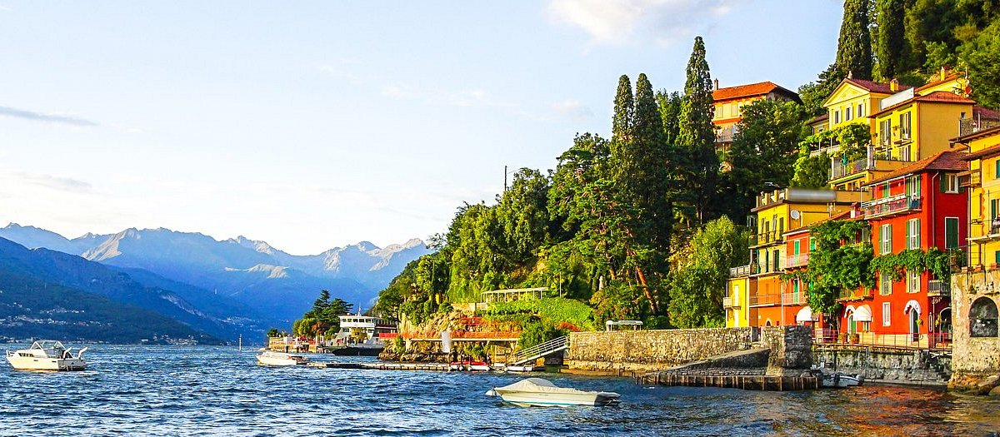

aft


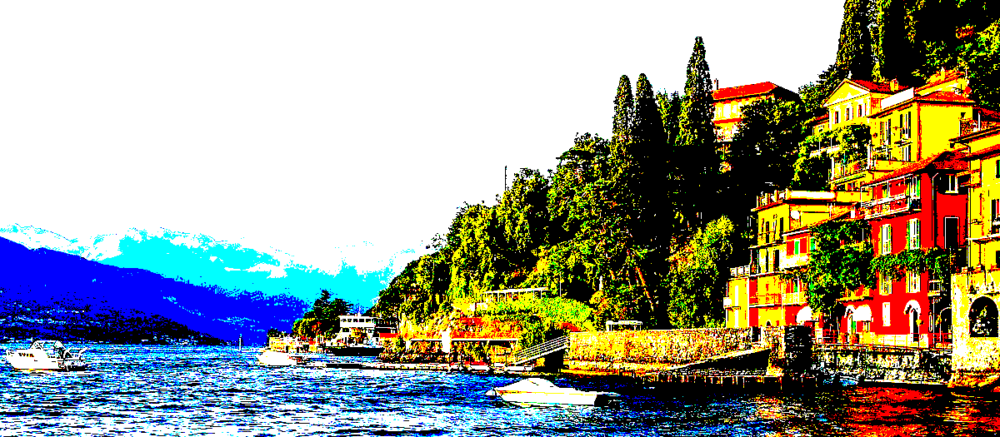

In [10]:
# 影像二值化/切一刀分兩半

import cv2
import numpy as np
import IPython.display as dp
from google.colab.patches import cv2_imshow

img =  cv2.imread("lake-como.jpg")

th, img2 = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
print(th)

print("bef")
cv2_imshow(img)

print("aft")
cv2_imshow(img2)

140.0
154.0
145.0
bef


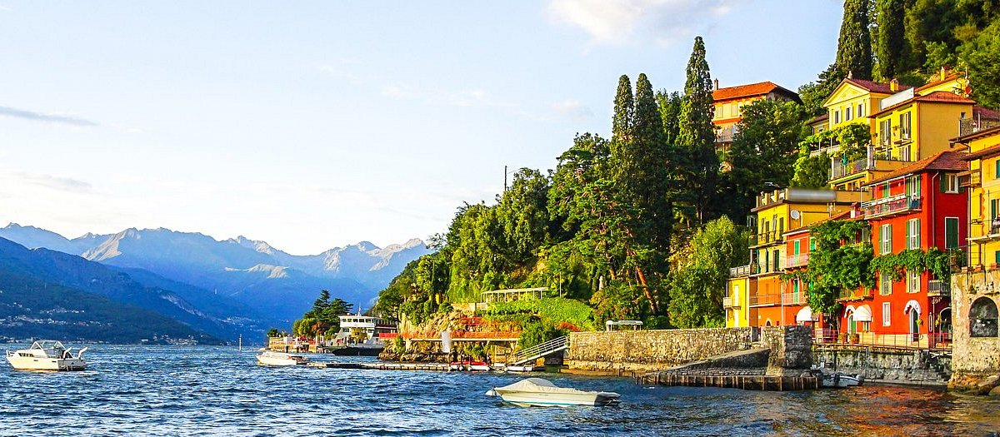

adaptiveThreshold


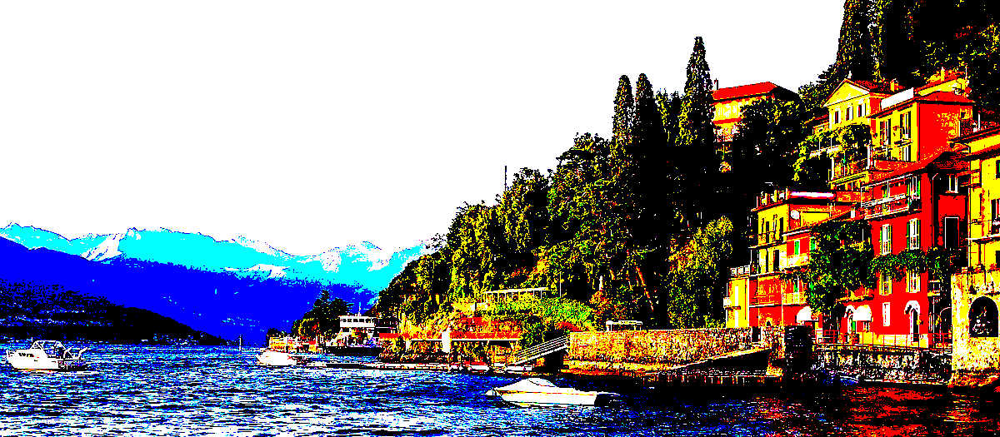

In [16]:
# 影像二值化/自動計算門檻值，只接受單一顏色通道，每顏色各自處理

import cv2
import numpy as np
import IPython.display as dp
from google.colab.patches import cv2_imshow

img =  cv2.imread("lake-como.jpg",1)
img2 = img.copy()

th, img2[:,:,0] = cv2.threshold(img[:,:,0], 200, 255, cv2.THRESH_OTSU)
print(th)
th, img2[:,:,1] = cv2.threshold(img[:,:,1], 200, 255, cv2.THRESH_OTSU)
print(th)
th, img2[:,:,2] = cv2.threshold(img[:,:,2], 200, 255, cv2.THRESH_OTSU)
print(th)

print("bef")
cv2_imshow(img)

print("auto Threshold")
cv2_imshow(img2)

127.0
bef


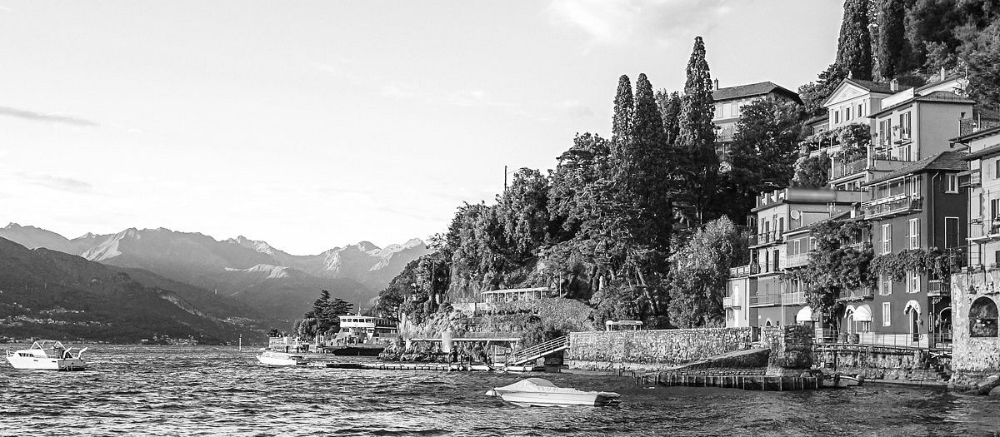

adaptiveThreshold


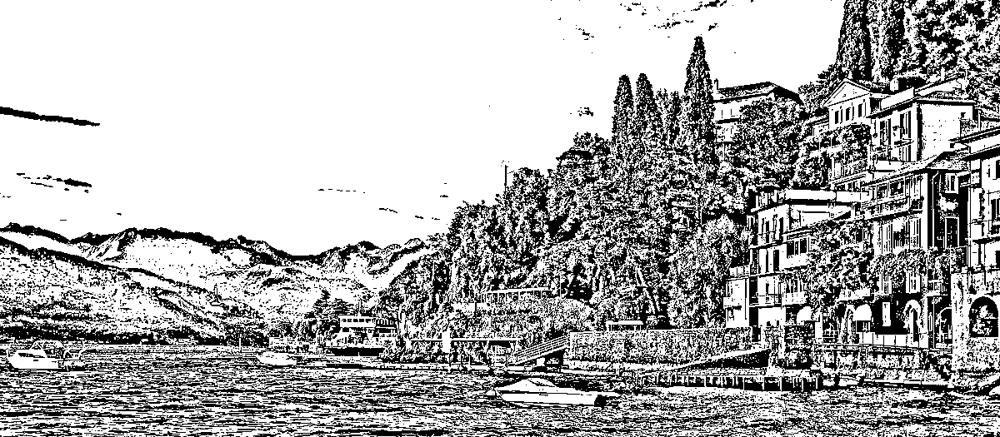

In [15]:
# 影像二值化/數個區塊計算門檻值，只接受單一顏色通道，每顏色各自處理

import cv2
import numpy as np
import IPython.display as dp
from google.colab.patches import cv2_imshow

img =  cv2.imread("lake-como.jpg",0) #gray
img2 = img.copy()

img2 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,45, 5) #區塊大小:45 越大圖形越明顯, 必為單數!
print(th)

print("bef")
cv2_imshow(img)

print("adaptiveThreshold")
cv2_imshow(img2)

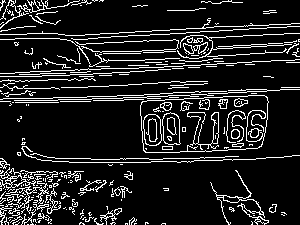

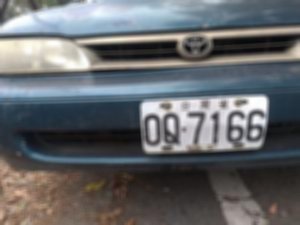

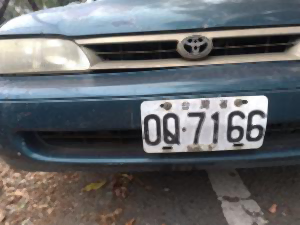

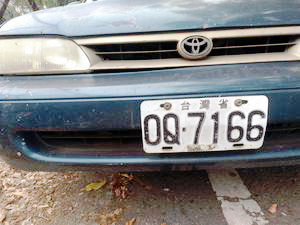

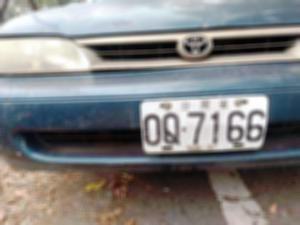

In [29]:
# 邊緣檢測

import cv2
import numpy as np
import IPython.display as dp
from google.colab.patches import cv2_imshow

img =  cv2.imread("car_num.jpg",1)
img2 = img.copy()

img2 = cv2.Canny(img, 100, 200)

cv2_imshow(img2)

# 平均值模糊化: 霧化效果，形還在
img3 = img.copy()

img3 = cv2.blur(img3, (5,5))
cv2_imshow(img3)

# 中值模糊化: 融化效果，需單數，數值越大效果越糊
img4 = img.copy()

img4 = cv2.medianBlur(img4, 3)
cv2_imshow(img4)

# 銳利化: 清晰度加強, 需單色處理
img5 = img.copy()

img5[:,:,0] = cv2.equalizeHist(img[:,:,0])
img5[:,:,1] = cv2.equalizeHist(img[:,:,1])
img5[:,:,2] = cv2.equalizeHist(img[:,:,2])
cv2_imshow(img5)


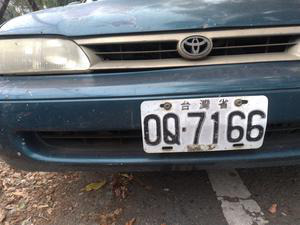

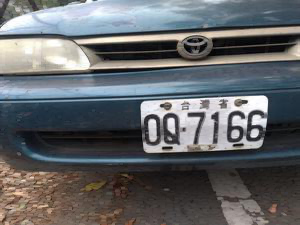

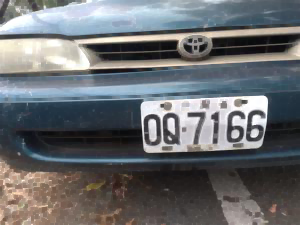

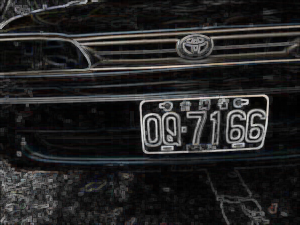

In [42]:
# 形態學 / 矩陣越大

import cv2
import numpy as np
import IPython.display as dp
from google.colab.patches import cv2_imshow

img =  cv2.imread("car_num.jpg",1)
img2 = img.copy()
cv2_imshow(img)
'''
# 侵蝕: 深色變明顯
img2 = cv2.erode(img, np.ones((3,3)))
cv2_imshow(img2)

# 膨脹: 白色變明顯
img3 = cv2.dilate(img, np.ones((5,5)))
cv2_imshow(img3)
'''

# 侵蝕+膨脹: 可除雜訊
img4 = cv2.morphologyEx(img, cv2.MORPH_OPEN, np.ones((3,3)))
cv2_imshow(img4)
img5 = cv2.morphologyEx(img, cv2.MORPH_CLOSE, np.ones((3,3)))
cv2_imshow(img5)
img6 = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, np.ones((3,3)))
cv2_imshow(img6)


In [ ]:
# 色彩篩選: 圖像遮罩，指定範圍指定顏色

import cv2
import numpy as np
import IPython.display as dp
from google.colab.patches import cv2_imshow

img =  cv2.imread("8888.jpg",1)
img2 = img.copy()

img2 = cv2.inRange(img, (50,50,50), (255,255,255)) # 排除範圍值的顏色
#img2 = cv2.inRange(img, (255,255,255), (50,50,50)) # 上下顛倒來選取

cv2_imshow(img)
cv2_imshow(img2)


In [ ]:
# 輪廓偵測與應用

import cv2
import numpy as np
import IPython.display as dp
from google.colab.patches import cv2_imshow

img =  cv2.imread("8888.jpg",1) #"TPE.png"
img2 = img.copy()

img2 = cv2.inRange(img, (50,50,50), (255,255,255))
#img2 = cv2.bitwise_not(img2) # 反向選取

# 取得輪廓: 儲存所有輪廓與其對應的階層資料
boards, b_hy = cv2.findContours(img2, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
#print(boards)

# 繪製輪廓
img3 = np.full(img.shape, (255,255,255), np.uint8) # empty img
cv2.drawContours(img3, boards, -1, (0,255,255), 2)

# 繪製各階層輪廓
img4 = np.full(img4.shape, (255,255,255), np.uint8) # empty img
img4 = img.copy()
print(len(boards))
for i in range(0, len(boards), 1):
  x, y, w, h = cv2.boundingRect(boards[i])
  cv2.rectangle(img4, (x,y), (x+w, y+h), (50,50,50), 2)


cv2_imshow(img)
cv2_imshow(img2)
cv2_imshow(img3)
cv2_imshow(img4)

In [84]:
# 安裝辨識模組
!apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 7s (685 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 123629 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-en

辨識結果1:  

辨識結果2:  

BF 8888

 

辨識結果:  

BF 8888

 



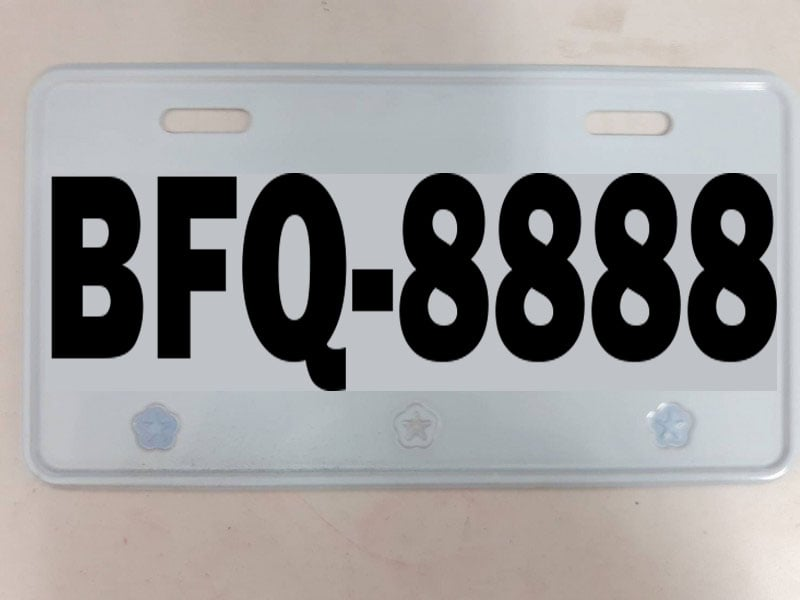

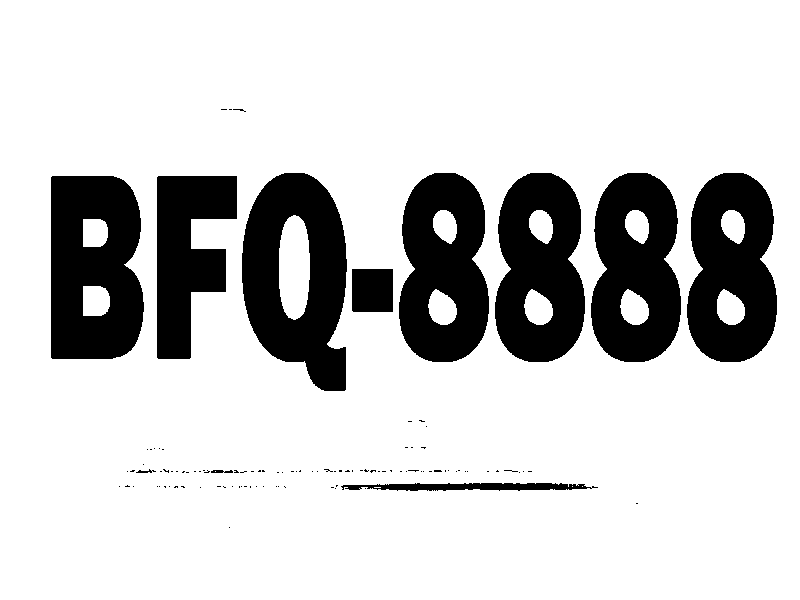

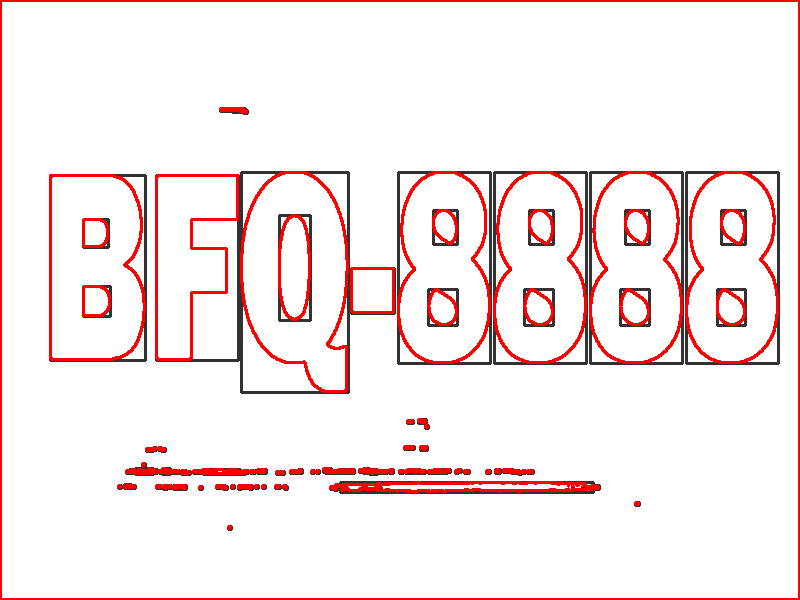

In [103]:
# 辨識

import pytesseract as pt
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

'''
# 文字辨識
img = cv2.imread("abc.png", 1)
text = pt.image_to_string(img, "eng")
print("辨識結果:", text)

# 下載中文語言包
https://github.com/tesseract-ocr/tessdata/blob/main/chi_tra.traineddata
upload to COLAB的語言包放置路徑在「/usr/share/tesseract-ocr/4.00/tessdata/」

# 中文辨識
img = cv2.imread("ch.png", 0)
text = pt.image_to_string(img, "chi_tra")
print("辨識結果:", text)
'''

# 車牌辨識
img = cv2.imread("8888.jpg", 1)
text = pt.image_to_string(img, "eng")
print("辨識結果1:", text)

img2 = cv2.inRange(img, (0,0,0), (150,150,150))
img2 = cv2.bitwise_not(img2) # 顏色反轉
text = pt.image_to_string(img2, "eng")
print("辨識結果2:", text)

img3 = np.full(img.shape, (255,255,255), np.uint8) # empty img
boards, b_hy = cv2.findContours(img2, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
for i in range(0, len(boards), 1):
  x, y, w, h = cv2.boundingRect(boards[i])
  cv2.rectangle(img3, (x,y), (x+w, y+h), (50,50,50), 2)

cv2.drawContours(img3, boards, -1, (0,0,255), 2)

text = pt.image_to_string(img2, "eng")
print("辨識結果:", text)

cv2_imshow(img)
cv2_imshow(img2)
cv2_imshow(img3)

In [110]:
# OCR辨識訓練: 限定字大小 16~20、且無雜訊，限一個PNG圖檔來源訓練
!python training.py




請輸入這個新語言包的名稱：my
請輸入要學習的圖檔名稱：source.png
Tesseract Open Source OCR Engine v4.1.1 with Leptonica
請先確認my.box檔案內容是否正確在按Enter鍵
Tesseract Open Source OCR Engine v4.1.1 with Leptonica
APPLY_BOXES:
   Boxes read from boxfile:       6
   Found 6 good blobs.
Generated training data for 2 words
Extracting unicharset from box file my.box
Other case a of A is not in unicharset
Other case b of B is not in unicharset
Other case c of C is not in unicharset
Wrote unicharset file unicharset
Reading my.tr ...
Building master shape table
Computing shape distances...
Stopped with 0 merged, min dist 999.000000
Computing shape distances...
Stopped with 0 merged, min dist 999.000000
Computing shape distances...
Stopped with 0 merged, min dist 999.000000
Computing shape distances... 0
Stopped with 0 merged, min dist 999.000000
Computing shape distances... 0
Stopped with 0 merged, min dist 999.000000
Computing shape distances... 0
Stopped with 0 merged, min dist 999.000000
Computing shape distances... 0
Stopped 

辨識結果: 123
ABC



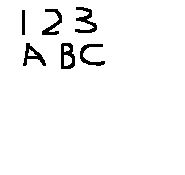

In [126]:
# OCR 辨識

import pytesseract as pt
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread("source.png", 1)

text = pt.image_to_string(img, "my")
print("辨識結果:", text)

cv2_imshow(img)

In [114]:
# 安裝條碼辨識模組

!apt install libzbar-dev
!pip install pyzbar


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fonts-droid-fallback fonts-noto-mono fonts-urw-base35 ghostscript gir1.2-freedesktop
  gir1.2-gdkpixbuf-2.0 gir1.2-rsvg-2.0 gsfonts imagemagick-6-common libblkid-dev libblkid1
  libcairo-script-interpreter2 libcairo2-dev libdjvulibre-dev libdjvulibre-text libdjvulibre21
  libffi-dev libfftw3-double3 libgdk-pixbuf-2.0-dev libgdk-pixbuf2.0-bin libglib2.0-dev
  libglib2.0-dev-bin libgs9 libgs9-common libice-dev libidn12 libijs-0.35 libjbig2dec0 libjxr-tools
  libjxr0 liblcms2-dev liblqr-1-0 liblqr-1-0-dev liblzo2-2 libmagick++-6-headers
  libmagick++-6.q16-8 libmagick++-6.q16-dev libmagick++-dev libmagickcore-6-arch-config
  libmagickcore-6-headers libmagickcore-6.q16-6 libmagickcore-6.q16-6-extra libmagickcore-6.q16-dev
  libmagickwand-6-headers libmagickwand-6.q16-6 libmagickwand-6.q16-dev libmount-dev libmount1
  libpixman-1-dev librsvg

In [118]:
# 驗證條碼辨識模組安裝成功
from pyzbar import pyzbar

Type: QRCODE
Rect: Rect(left=467, top=295, width=97, height=97)
Data: http://en.m.wikipedia.org

Type: QRCODE
Rect: Rect(left=334, top=9, width=174, height=173)
Data: What if God was one of us?
Just a slob like one of us
Just a stranger on the bus
Tryin' to make his way home?

Type: QRCODE
Rect: Rect(left=531, top=11, width=169, height=169)
Data: https://youtube.com/@ncbilabs



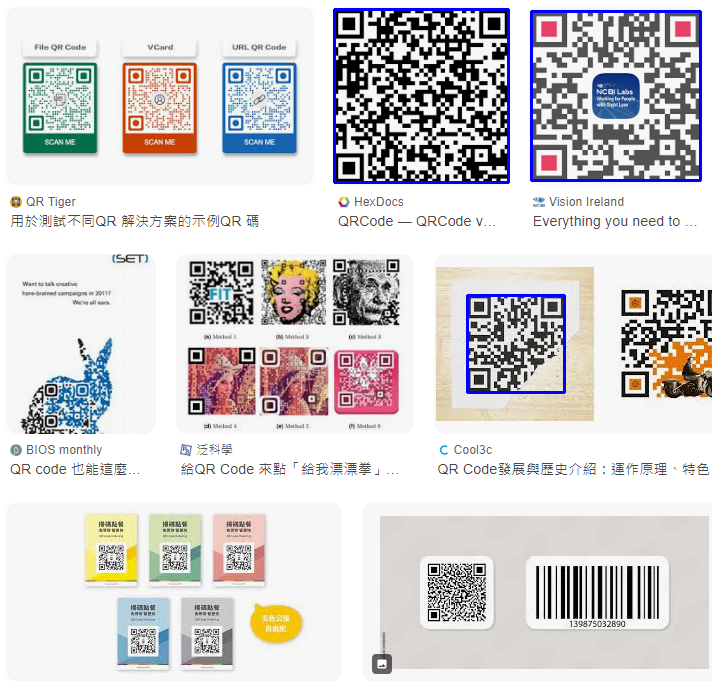

In [135]:
# 條碼辨識

from pyzbar import pyzbar
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread("multiple_qr.png", 1) # "qr_wiki.png"

r = pyzbar.decode(img) # r is list type
for d in r:
  print("Type:", d.type)
  print("Rect:", d.rect)
  print("Data:", d.data.decode("utf-8")) # decode binary data of d.data otherwise it'll show 'b https://...'
  x,y, w, h = d.rect
  cv2.rectangle(img, (x, y), (x+w, y+h), (255,0,0), 2)
  print("")

cv2_imshow(img)

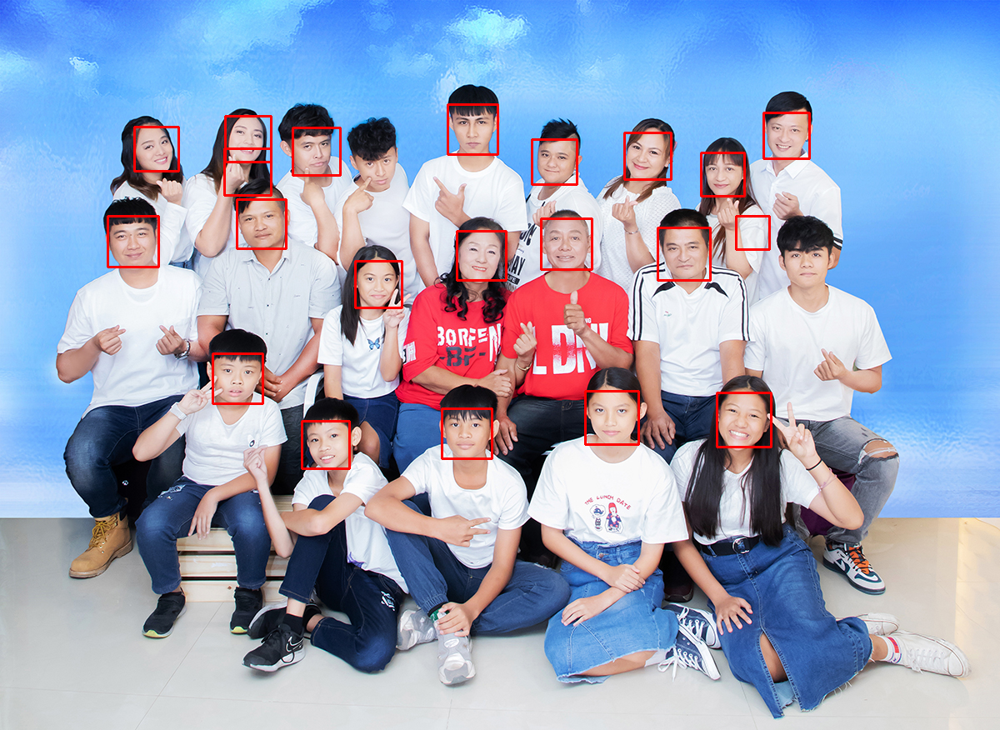

In [147]:
# 人臉辨識: 廣泛使用

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread("people.jpg", 1)

p = cv2.CascadeClassifier("haarcascade_frontalface_default.xml")
r = p.detectMultiScale(img, minNeighbors=3, minSize=(30,30)) # minNeighbors:符合特徵數量 越大越嚴謹，minSize 越小雜訊越多
for (x,y,w, h) in r:
  cv2.rectangle(img, (x, y), (x+w, y+h), (0,0,255), 2)

cv2_imshow(img)